# Introduction to Altair: Interaction (3/3)

Visualization provides a powerful means of making sense of data. A single image, however, typically provides answers to, at best, a handful of questions. Through _interaction_ we can transform static images into tools for exploration: highlighting points of interest, zooming in to reveal finer-grained patterns, and linking across multiple views to reason about multi-dimensional relationships.

At the core of interaction is the notion of a _selection_: a means of indicating to the computer which elements or regions we are interested in. For example, we might hover the mouse over a point, click multiple marks, or draw a bounding box around a region to highlight subsets of the data for further scrutiny.

Alongside visual encodings and data transformations, Altair provides a _selection_ abstraction for authoring interactions. These selections encompass three aspects:

1. Input event handling to select points or regions of interest, such as mouse hover, click, drag, scroll, and touch events.
2. Generalizing from the input to form a selection rule (or [_predicate_](https://en.wikipedia.org/wiki/Predicate_%28mathematical_logic%29)) that determines whether or not a given data record lies within the selection.
3. Using the selection predicate to dynamically configure a visualization by driving _conditional encodings_, _filter transforms_, or _scale domains_.

This notebook introduces interactive selections and explores how to use them to author a variety of interaction techniques, such as dynamic queries, panning &amp; zooming, details-on-demand, and brushing &amp; linking.

_This notebook is part of [the Vega-Lite + Altair Workshop at SDSS 2019](https://ww2.amstat.org/meetings/sdss/2019/onlineprogram/AbstractDetails.cfm?AbstractID=305112)._

_Acknowledgement:_ This series of notebook-based workshop materials is adapted from the University of Washington's [Data Visualization Curriculum](https://github.com/uwdata/visualization-curriculum), with examples from the [Vega-Lite presentation video from OpenVisConf 2017](https://www.youtube.com/watch?v=9uaHRWj04D4) for a short workshop (60-90 minutes).

## Import Libraries and Data

In [1]:
import pandas as pd
import altair as alt

In this notebook, We will be working with a table of data about motion pictures, taken from the [vega-datasets](https://vega.github.io/vega-datasets/) collection. The data includes variables such as the film name, director, genre, release date, ratings, and gross revenues. Note: the films are from unevenly sampled years, using data combined from multiple sources. If you dig in you will find issues with missing values and even some subtle errors! Nevertheless, the data should prove interesting to explore...

In [2]:
from vega_datasets import data  # import vega_datasets
movies = data.movies()
movies.head()

,Creative_Type,Director,Distributor,IMDB_Rating,IMDB_Votes,MPAA_Rating,Major_Genre,Production_Budget,Release_Date,Rotten_Tomatoes_Rating,Running_Time_min,Source,Title,US_DVD_Sales,US_Gross,Worldwide_Gross
0,None,None,Gramercy,6.1,1071.0,R,None,8000000.0,Jun 12 1998,NaN,NaN,None,The Land Girls,NaN,146083.0,146083.0
1,None,None,Strand,6.9,207.0,R,Drama,300000.0,Aug 07 1998,NaN,NaN,None,"First Love, Last Rites",NaN,10876.0,10876.0
2,None,None,Lionsgate,6.8,865.0,None,Comedy,250000.0,Aug 28 1998,NaN,NaN,None,I Married a Strange Person,NaN,203134.0,203134.0
3,None,None,Fine Line,NaN,NaN,None,Comedy,300000.0,Sep 11 1998,13.0,NaN,None,Let's Talk About Sex,NaN,373615.0,373615.0
4,Contemporary Fiction,None,Trimark,3.4,165.0,R,Drama,1000000.0,Oct 09 1998,62.0,NaN,Original Screenplay,Slam,NaN,1009819.0,1087521.0


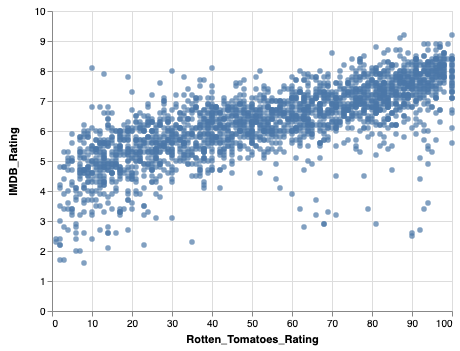

In [3]:
chart = alt.Chart(movies).mark_circle().encode(
    x='Rotten_Tomatoes_Rating',
    y='IMDB_Rating'
)
chart

## Warm Up: Tooltips

Before we get to the richer interactions Altair supports, let's warm up by adding tooltips to display the `Title` of each movie. As tooltips are a common interaction technique, Altair provides a `tooltip` encoding channel

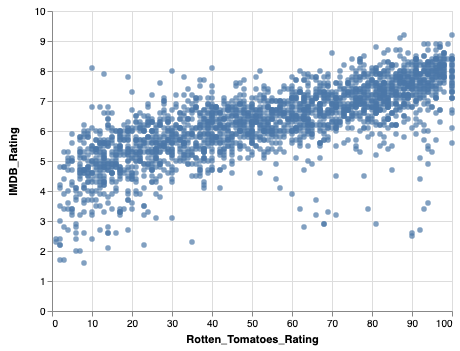

In [4]:
chart.encode(
    tooltip='Title:N'
)

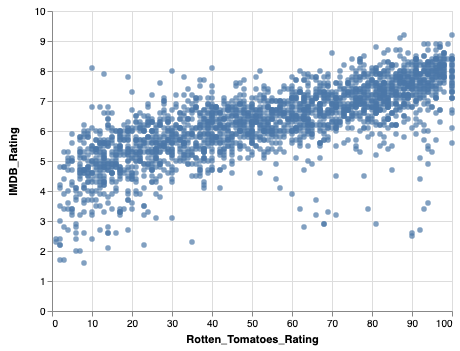

In [5]:
chart.encode(
    # tooltip channel can take one or more fields
)

## Quick interactive chart

Altair provides a shorthand to create interactive charts with `.interactive()`.

## Introducing Selections

For richer interaction, Altair provides _selections_: a way of indicating which elements or regions we are interested in. Let's start with a basic selection: simply clicking a point to highlight it. We can create this selection by calling `alt.selection_single()`, indicating we want a selection defined over a _single value_. 




In [7]:
single_sel = alt.selection_single();

By default, the selection uses a mouse click to determine the selected value. To register a selection with a chart, we must add it using the `.add_selection()` method.

Once our selection has been defined, we can use it as a parameter for _conditional encodings_, which apply a different encoding depending on whether a data record lies in or out of the selection. 

For example, we can set

~~~ python
opacity=alt.condition(single_sel, alt.value(0.75), alt.value(0.05))
~~~

In [8]:
# Scatterplot with single selection highlighting

Of course, highlighting individual data points one-at-a-time is not particularly exciting! As we'll see, however, single value selections provide a useful building block for more powerful interactions. Moreover, single value selections are just one of the three selection types provided by Altair:

- `selection_single` - select a single discrete value, by default on click events. 
- `selection_multi` - select multiple discrete values. The first value is selected on mouse click and additional values toggled using shift-click. 
- `selection_interval` - select a continuous range of values, initiated by mouse drag.

In [9]:
# Scatterplot with multi-selection highlighting

In [10]:
# Scatterplot with interval selection highlighting

In [11]:
# Concatenate two charts with interval selections and encode Production_Budget as y

## Dynamic Queries

We often want to be able to interactively filter using widgets like sliders, radio buttons, and drop-down menus. To dynamically generate these widgets, we can apply a `bind` operation to a single selection, and specify one or more data fields we wish to query.

For instance, let's add a dynamic query to filter our scatterplot over the `Major Genre` field.

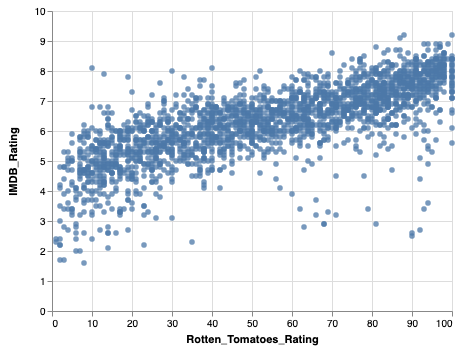

In [14]:
# hidden

selectGenre = alt.selection_single(
    name='Select',
    fields=['Major_Genre'], # Limit the selection to the Major_Genre field
    bind=alt.binding_select(options=genres) # bind to a drop-down (select) menu
)

chart.add_selection(
    selectGenre
).encode(
    opacity=alt.condition(selectGenre, alt.value(0.75), alt.value(0.05))
)

To create this chart, we start by extracting the unique (non-null) genres:

In [13]:
genres = movies['Major_Genre'].unique()    # get unique field values
genres = list(filter(lambda d: d is not None, genres)) # filter out None values
genres.sort() # sort alphabetically

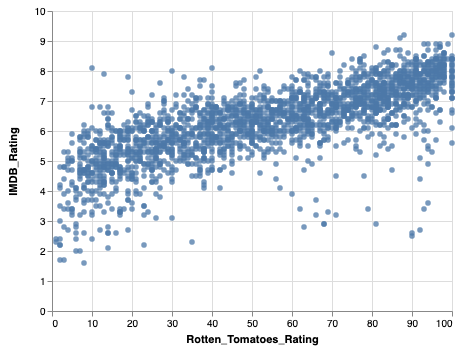

In [15]:
selectGenre = alt.selection_single(
    # Limit the selection to the Major_Genre field
    # bind to a drop-down (select) menu
)

alt.Chart(movies).mark_circle().add_selection(
    selectGenre
).encode(
    x='Rotten_Tomatoes_Rating',
    y='IMDB_Rating',
    opacity=alt.condition(selectGenre, alt.value(0.75), alt.value(0.05))
)

Of course, we're not restricted to using just one widget! We can bind _multiple_ query widgets (e.g., providing a filter for _both_ `Major_Genre` and `MPAA_Rating`, using radio buttons instead of a menu). 

We define our `single` selection over a _pair_ of genre-rating values, and then specifying a dictionary of bindings.

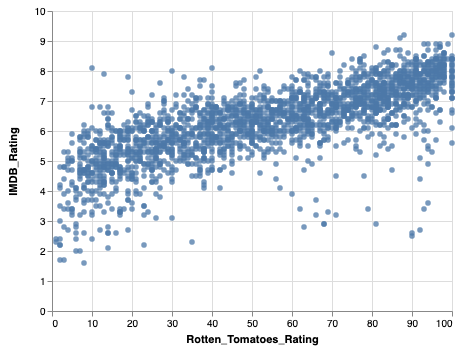

In [16]:
mpaa = ['G', 'PG', 'PG-13', 'R', 'NC-17', 'Not Rated']

selectGenreMPAA = alt.selection_single(
    # Limit the selection to both Major_Genre and MPAA_Rating fields
    # bind to a drop-down (select) menu and radio buttons respectively.
)

chart.add_selection(
    selectGenreMPAA
).encode(
    opacity=alt.condition(selectGenreMPAA, alt.value(0.75), alt.value(0.05))
)

### Using Visualization as Dynamic Queries

Standard widgets give us a nice way of querying for _possible_ values but they don't visualize the _distribution_ of those values. We might also wish for richer interactions (e.g., multi-value or interval selections) rather than widgets that only allow us to select a single value at a time.

For these situations, we can compose multiple charts together and have interactions in one determine the data displayed in the other. 

For example, in the following visualization, the top chart visualizes a histogram of the number of films per year. We can add an interval selection to dynamically highlight films in our scatterplot over the selected time periods.

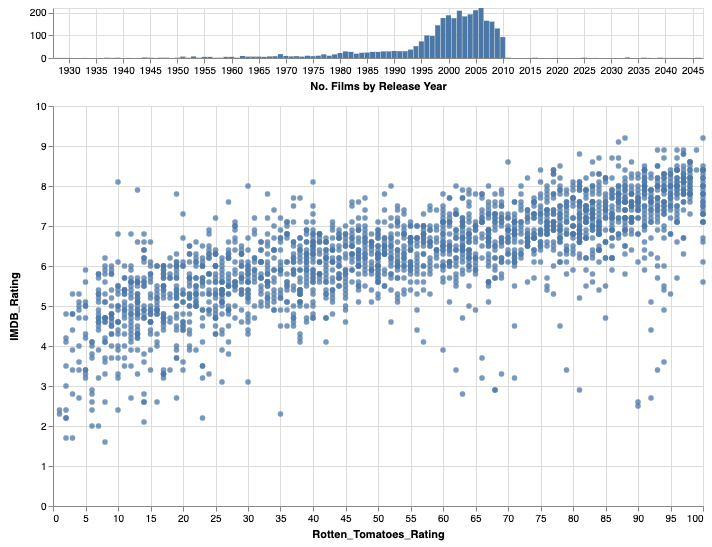

In [17]:
brush = alt.selection_interval(encodings=['x'])

# Dynamic query histogram
years = alt.Chart(movies).mark_bar().add_selection(
    brush
).encode(
    x=alt.X('year(Release_Date)', title='No. Films by Release Year'),
    y=alt.Y('count()', title=None)
).properties(width=650, height=50)

# Ratings scatterplot
ratings = chart.encode(
    opacity=alt.condition(brush, alt.value(0.75), alt.value(0.05))
).properties(width=650, height=400)

alt.vconcat(years, ratings).properties(spacing=5)

## Panning & Zooming

The movie rating scatter plot is a bit cluttered in places, making it hard to examine points in denser regions. Using the interaction techniques of _panning_ and _zooming_, we can inspect dense regions more closely.

Let's start by thinking about how we might express panning and zooming using Altair selections. What defines the "viewport" of a chart? _Axis scale domains!_

We can change the scale domains to modify the visualized range of data values. To do so interactively, we can bind an `interval` selection to scale domains with the code `bind='scales'`. The result is that instead of an interval brush that we can drag and zoom, we instead can drag and zoom the entire plotting area!

In [18]:
large_chart = chart.properties(
    width=600,
    height=400
)

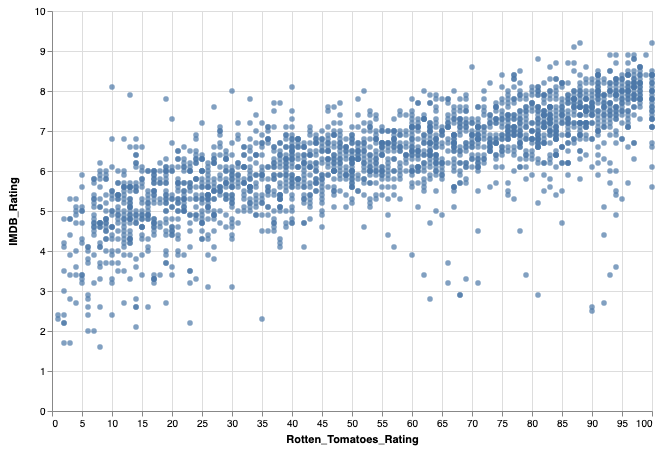

In [19]:
large_chart.add_selection(
    # An interval selection bound to scales
)

By default, interval selections occur in both the `x` and `y` dimensions. So, when we establish scale bindings, we can pan and zoom in both directions as well. 

However, we can limit the interactions to a single dimension by invoking `encodings=['x']` to constrain the selection to the `x` channel only:

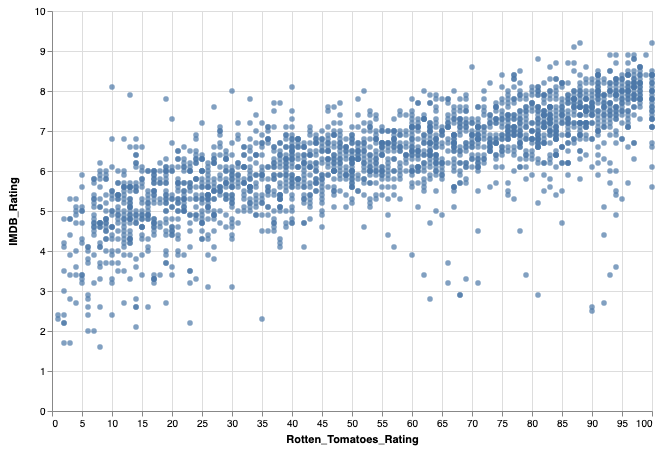

In [20]:
large_chart.add_selection(
    # An interval selection bound to scales, constrained to x
)

## Navigation: Overview + Detail

When panning and zooming, we directly adjust the "viewport" of a chart. The related navigation strategy of _overview + detail_ instead uses an overview display to show _all_ of the data, while supporting selections that pan and zoom a separate focus display.

Below we have two area charts showing a decade of price fluctuations for the S&P 500 stock index. Initially both charts show the same data range.

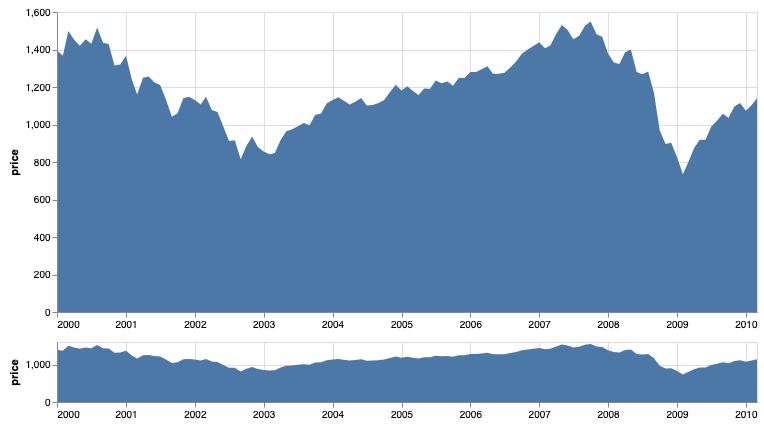

In [21]:
brush = alt.selection_interval(encodings=['x'])

# Base chart that we'll reproduce twice
base = alt.Chart(data.sp500()).mark_area().encode(
    alt.X('date:T', title=None),
    alt.Y('price:Q')
).properties(
    width=700
)
  
base.encode(
    # Set x scale domain to `brush.ref()`
) & base.properties(height=60)  # Add selection to bottom chart

## Brushing & Linking, Revisited

Earlier in this notebook we saw an example of _brushing &amp; linking_: using a dynamic query histogram to highlight points in a movie rating scatter plot. Here, we'll visit some additional examples involving linked selections.

We can use the `repeat` operator to build a [scatter plot matrix (SPLOM)](https://en.wikipedia.org/wiki/Scatter_plot#Scatterplot_matrices) that show associations between the production budget and gross earnings in the United States and worldwide. We can define an `interval` selection and include it _within_ our repeated scatter plot specification to enable linked selections among all the plots.

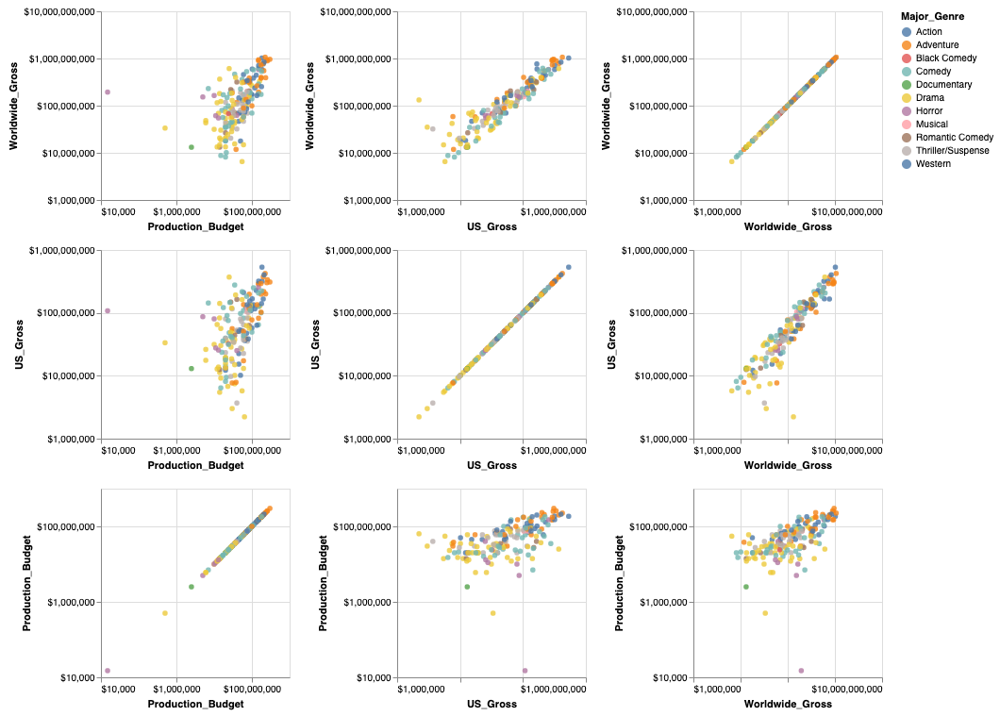

In [22]:
# Clean the data
movies_cleaned = movies[(movies['Production_Budget'] != 0) & (movies['US_Gross'] != 0) & (movies['Worldwide_Gross'] != 0)].dropna()

brush = alt.selection_interval(
    resolve='global', # resolve all selections to a single global instance,
)

alt.Chart(movies_cleaned).mark_circle().add_selection(
    brush
).encode(
    alt.X(alt.repeat('column'), type='quantitative', scale=alt.Scale(type='log'), axis=alt.Axis(tickCount=3, format='$,')),
    alt.Y(alt.repeat('row'), type='quantitative', scale=alt.Scale(type='log'), axis=alt.Axis(tickCount=3, format='$,')),
    color=alt.condition(brush, 'Major_Genre', alt.value('grey')),
    opacity=alt.condition(brush, alt.value(0.8), alt.value(0.1))
).properties(
    width=200,
    height=200
).repeat(
    column=['Production_Budget', 'US_Gross', 'Worldwide_Gross'],
    row=['Worldwide_Gross', 'US_Gross', 'Production_Budget']
)

## Cross-Filtering

The brushing &amp; linking examples we've looked at all use conditional encodings, for example to change opacity values in response to a selection. Another option is to use a selection defined in one view to _filter_ the content of another view.

Let's build a collection of histograms for the `flights` dataset: arrival `delay` (how early or late a flight arrives, in minutes), `distance` flown (in miles), and `time` of departure (hour of the day). We'll use the `repeat` operator to create the histograms, and add an `interval` selection for the `x` axis with brushes resolved via intersection.

In particular, each histogram will consist of two layers: a gray background layer and a blue foreground layer, with the foreground layer filtered by our intersection of brush selections. The result is a _cross-filtering_ interaction across the three charts!

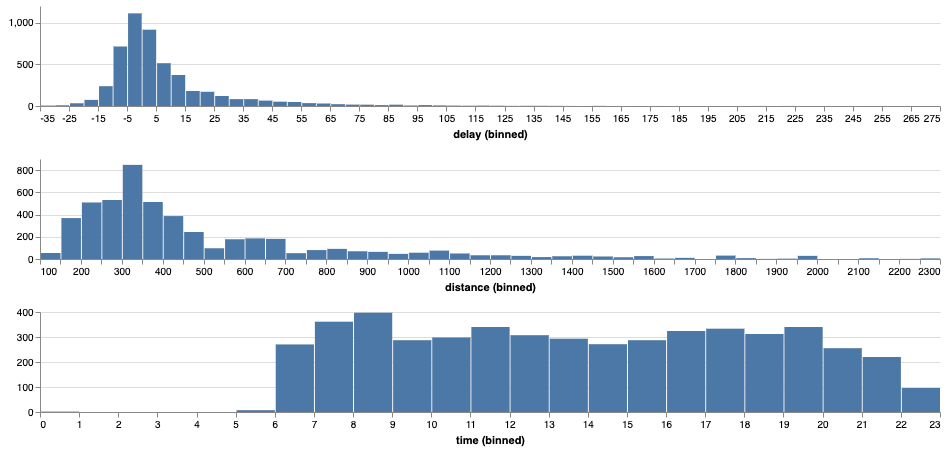

In [24]:
brush = alt.selection_interval(
    encodings=['x'],
    resolve='intersect'
);

hist = alt.Chart().mark_bar().encode(
    alt.X(alt.repeat('row'), type='quantitative',
        bin=alt.Bin(maxbins=100, minstep=1), # up to 100 bins
        axis=alt.Axis(format='d') # integer format
    ),
    alt.Y('count():Q', title=None) # no y-axis title
).properties(
    width=900,
    height=100
)
  
alt.layer(
    hist.add_selection(brush).encode(color=alt.value('lightgrey')),
    hist.transform_filter(brush)
).repeat(
    row=['delay', 'distance', 'time'],
    data=data.flights_5k()
).transform_calculate(
    time='hours(datum.date)' # fractional hours
).configure_view(
    stroke='transparent' # no outline
)

_By cross-filtering you can observe that delayed flights are more likely to depart at later hours. This phenomenon is familiar to frequent fliers: a delay can propagate through the day, affecting subsequent travel by that plane. For the best odds of an on-time arrival, book an early flight!_

The combination of multiple views and interactive selections can enable valuable forms of multi-dimensional reasoning, turning even basic histograms into powerful input devices for asking questions of a dataset!

## Summary

For more information about the supported interaction options in Altair, please consult the [Altair interactive selection documentation](https://altair-viz.github.io/user_guide/interactions.html). For details about customizing event handlers, for example to compose multiple interaction techniques or support touch-based input on mobile devices, see the [Vega-Lite selection documentation](https://vega.github.io/vega-lite/docs/selection.html).

Interested in learning more?
- The _selection_ abstraction was introduced in the paper [Vega-Lite: A Grammar of Interactive Graphics](http://idl.cs.washington.edu/papers/vega-lite/), by Satyanarayan, Moritz, Wongsuphasawat, &amp; Heer.
- The PRIM-9 system (for projection, rotation, isolation, and masking in up to 9 dimensions) is one of the earliest interactive visualization tools, built in the early 1970s by Fisherkeller, Tukey, &amp; Friedman. [A retro demo video survives!](http://stat-graphics.org/movies/prim9.html)
- The concept of brushing &amp; linking was crystallized by Becker, Cleveland, &amp; Wilks in their 1987 article [Dynamic Graphics for Data Analysis](https://scholar.google.com/scholar?cluster=14817303117298653693).
- For a comprehensive summary of interaction techniques for visualization, see [Interactive Dynamics for Visual Analysis](https://queue.acm.org/detail.cfm?id=2146416) by Heer &amp; Shneiderman.
- Finally, for a treatise on what makes interaction effective, read the classic [Direct Manipulation Interfaces](https://scholar.google.com/scholar?cluster=15702972136892195211) paper by Hutchins, Hollan, &amp; Norman.